In [1]:
from augmentations import *
import itk
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['image.cmap'] = 'gray'
set_seed(1000)

In [2]:
root_data = 'C:/Users/20203531/OneDrive - TU Eindhoven/Y3/Q4/BEP/BEP_MIA_DIR/4DCT/data/'

# Original data
dataset_original = DatasetLung(train_val_test='train', version='',
                                root_data=root_data, augmenter=None, phases='in_ex')
imgs_moving, imgs_fixed = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_original])
# Gryds augmentation
augmenter_gryds = Augmentation_gryds()
dataset_synthetic_gryds = DatasetLung(train_val_test='train', version='', root_data=root_data, 
                                augmenter=augmenter_gryds, augment="gryds", save_augmented=False, phases='in_ex')
imgs_moving_gryds, imgs_fixed_gryds = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_synthetic_gryds])

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:3484.)


## Fig 1. Atlas and examples of DVFs

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


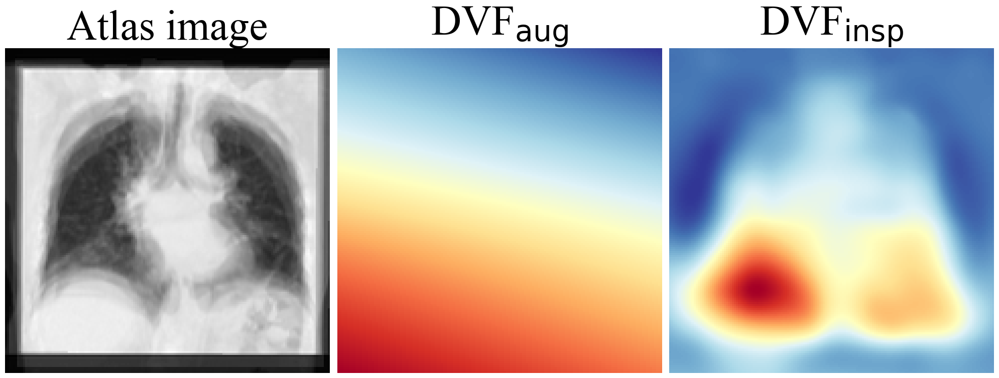

In [142]:
# img_atlas = augmenter_SMOD.generate_atlas(img_data=[itk.image_from_array(img_exhaled[0]) 
#                                              for img_exhaled in imgs_moving])
# DVF_inhaled_s15000 = augmenter_SMOD.generate_artificial_DVFs(DVFs_artificial_components=augmenter_SMOD.DVF_inhaled_components, 
#                                                 sigma=15000)
# DVF_exhaled_s2000 = augmenter_SMOD.generate_artificial_DVFs(DVFs_artificial_components=augmenter_SMOD.DVF_exhaled_components, 
#                                                 sigma=2000)

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(img_atlas[:,64,:], cmap="gray")
axs[0].set_title('Atlas image', fontsize=60)
axs[1].imshow(DVF_inhaled_s15000[:,64,:,2], cmap="RdYlBu")
axs[1].set_title('DVF'+r'$_{\mathrm{aug}}$', fontsize=60)
axs[2].imshow(DVF_exhaled_s2000[:,64,:,2], cmap="RdYlBu")
axs[2].set_title('DVF'+r'$_{\mathrm{insp}}$', fontsize=60)
for ax in axs.flatten():
    ax.set_axis_off()
plt.tight_layout()
fig.show()

## Fig 2. SMOD examples versions with final parameters

In [4]:
# Prepare data
augmenter_SMOD = Augmentation_SMOD(root_data=root_data, original_dataset=dataset_original,
                                    sigma1=30000, sigma2=4000, plot=False, load_atlas=True, 
                                    load_preprocessing=True, save_preprocessing=False)
# SMOD_full
dataset_synthetic_SMOD = DatasetLung(train_val_test='train', version='', root_data=root_data, 
                                augmenter=augmenter_SMOD, augment="SMOD", save_augmented=False)
imgs_moving_SMOD, imgs_fixed_SMOD = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_synthetic_SMOD])
# SMOD_isnp
dataset_synthetic_SMOD_insp = DatasetLung(train_val_test='train', version='', root_data=root_data, 
                                augmenter=augmenter_SMOD, augment="SMOD_breath", save_augmented=False)
imgs_moving_SMOD_insp, imgs_fixed_SMOD_insp = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_synthetic_SMOD_insp])

Loading preprocessing data...
Done with augmentation initialization
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating art

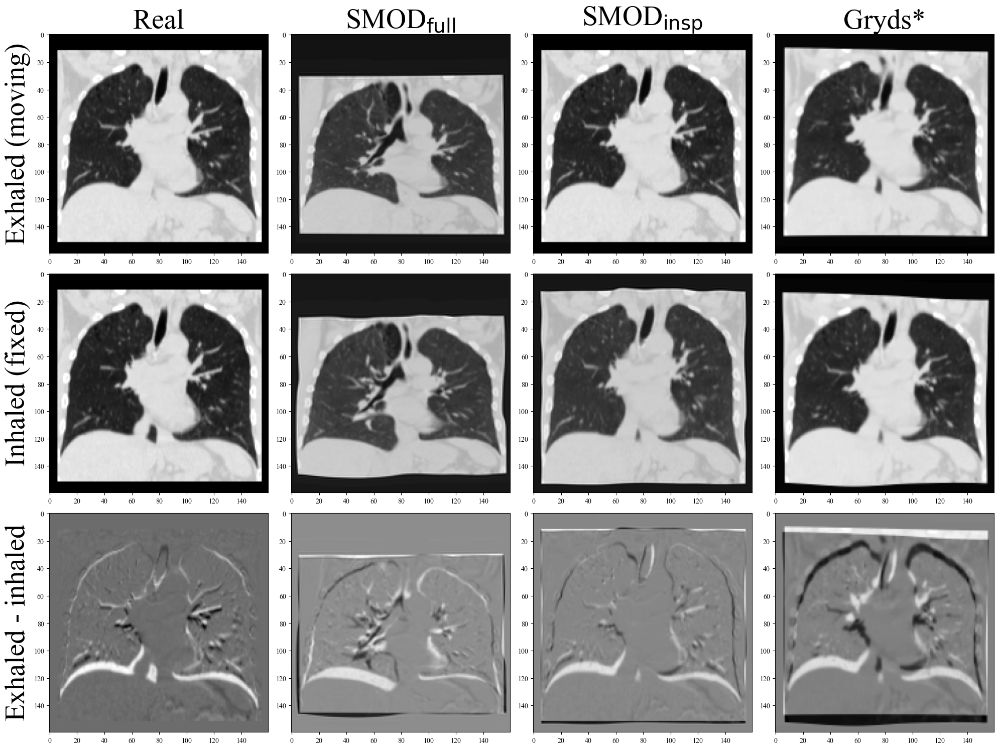

In [8]:
i=2

fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))

moving, fixed = np.asarray(imgs_moving[i][0]), np.asarray(imgs_fixed[i][0])
axs[0,0].imshow(moving[:,64,:], cmap='gray')
# axs[0,0].set_title('Exhaled (moving)', fontsize=40)
axs[1,0].imshow(fixed[:,64,:], cmap='gray')
# axs[1,0].set_title('Inhaled (fixed)', fontsize=40)
axs[2,0].imshow((moving - fixed)[:,64,:], cmap='gray')
# axs[2,0].set_title('Exhaled - Inhaled', fontsize=40)


moving_SMOD, fixed_SMOD = np.asarray(imgs_moving_SMOD[i][0].to("cpu")), np.asarray(imgs_fixed_SMOD[i][0].to("cpu"))
axs[0,1].imshow(moving_SMOD[:,64,:], cmap='gray')
# axs[0,1].set_title('Exhaled SMOD'+r'$_{\mathrm{full}}$', fontsize=40)
axs[1,1].imshow(fixed_SMOD[:,64,:], cmap='gray')
# axs[1,1].set_title('Inhaled SMOD'+r'$_{\mathrm{full}}$', fontsize=40)
axs[2,1].imshow((moving_SMOD - fixed_SMOD)[:,64,:], cmap='gray')
# axs[2,1].set_title('Exhaled - Inhaled', fontsize=40)

moving_SMOD_insp, fixed_SMOD_insp = np.asarray(imgs_moving_SMOD_insp[i][0].to("cpu")), np.asarray(imgs_fixed_SMOD_insp[i][0].to("cpu"))
axs[0,2].imshow(moving_SMOD_insp[:,64,:], cmap='gray')
# axs[0,2].set_title('Exhaled SMOD'+r'$_{\mathrm{insp}}$', fontsize=40)
axs[1,2].imshow(fixed_SMOD_insp[:,64,:], cmap='gray')
# axs[1,2].set_title('Inhaled SMOD'+r'$_{\mathrm{insp}}$', fontsize=40)
axs[2,2].imshow((moving_SMOD_insp - fixed_SMOD_insp)[:,64,:], cmap='gray')
# axs[2,2].set_title('Exhaled - Inhaled', fontsize=40)

moving_gryds, fixed_gryds = np.asarray(imgs_moving_gryds[i][0].to("cpu")), np.asarray(imgs_fixed_gryds[i][0].to("cpu"))
axs[0,3].imshow(moving_gryds[:,64,:], cmap='gray')
# axs[0,3].set_title('Exhaled Gryds*', fontsize=40)
axs[1,3].imshow(fixed_gryds[:,64,:], cmap='gray')
# axs[1,3].set_title('Inhaled Gryds*', fontsize=40)
axs[2,3].imshow((moving_gryds - fixed_gryds)[:,64,:], cmap='gray')
# axs[2,3].set_title('Exhaled - Inhaled', fontsize=40)

cols = ['Real', 'SMOD'+r'$_{\mathrm{full}}$', 'SMOD'+r'$_{\mathrm{insp}}$', "Gryds*"]
rows = ["Exhaled (moving)", "Inhaled (fixed)", "Exhaled - inhaled"] 

# for ax in axs.flatten():
#     ax.set_axis_off()

for ax, col in zip(axs[0], cols):
    ax.set_title(col, fontsize=40)

for ax, row in zip(axs[:,0], rows):
    ax.set_ylabel(row, rotation=90, fontsize=40) #! doesnt work



plt.tight_layout()
plt.show()


## Multiple SMOD full and SMOD insp images to show variations

In [9]:
# SMOD_full
dataset_synthetic_SMOD = DatasetLung(train_val_test='train', version='', root_data=root_data, 
                                augmenter=augmenter_SMOD, augment="SMOD", save_augmented=False)
imgs_moving_SMOD1, imgs_fixed_SMOD1 = dataset_synthetic_SMOD[2]
imgs_moving_SMOD2, imgs_fixed_SMOD2 = dataset_synthetic_SMOD[2]
imgs_moving_SMOD3, imgs_fixed_SMOD3 = dataset_synthetic_SMOD[2]
imgs_moving_SMOD4, imgs_fixed_SMOD4 = dataset_synthetic_SMOD[2]

# SMOD_isnp
# dataset_synthetic_SMOD_insp = DatasetLung(train_val_test='train', version='', root_data=root_data, 
#                                 augmenter=augmenter_SMOD, augment="SMOD_breath", save_augmented=False)
# imgs_moving_SMOD_insp, imgs_fixed_SMOD_insp = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_synthetic_SMOD_insp])

Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image


Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image


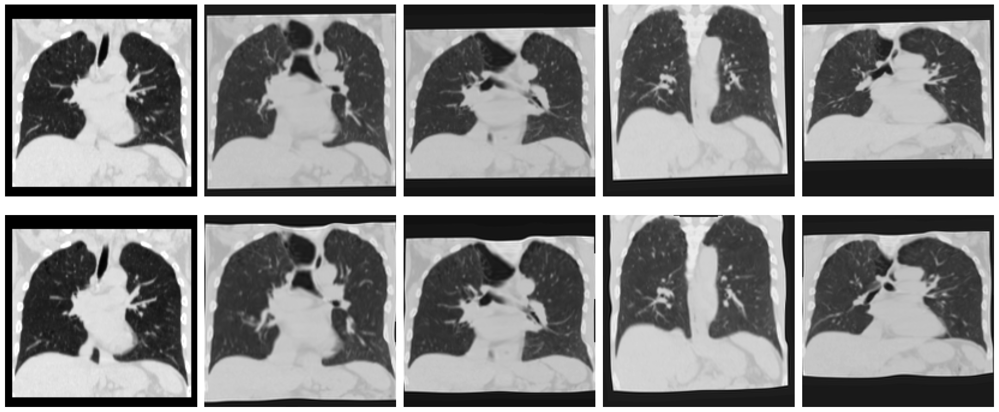

In [19]:
dataset_synthetic_SMOD = DatasetLung(train_val_test='train', version='', root_data=root_data, 
                                augmenter=augmenter_SMOD, augment="SMOD", save_augmented=False)

i=2
cols=5
fig, axs = plt.subplots(nrows=2, ncols=cols, figsize=(20, 9))

moving, fixed = np.asarray(imgs_moving[i][0]), np.asarray(imgs_fixed[i][0])
axs[0,0].imshow(moving[:,64,:], cmap='gray')
axs[1,0].imshow(fixed[:,64,:], cmap='gray')

for j in range(cols-1):
    moving_SMOD, fixed_SMOD = dataset_synthetic_SMOD[i]
    moving_SMOD, fixed_SMOD = np.asarray(moving_SMOD[0].to("cpu")), np.asarray(fixed_SMOD[0].to("cpu"))
    axs[0,j+1].imshow(moving_SMOD[:,64,:], cmap='gray')
    axs[1,j+1].imshow(fixed_SMOD[:,64,:], cmap='gray')

for ax in axs.flatten():
    ax.set_axis_off()

rows = ["Exhaled (moving)", "Inhaled (fixed)"] 
for ax, row in zip(axs[:,0], rows):
    ax.set_ylabel(row, rotation=90, fontsize=40)



plt.tight_layout()
plt.show()

Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image


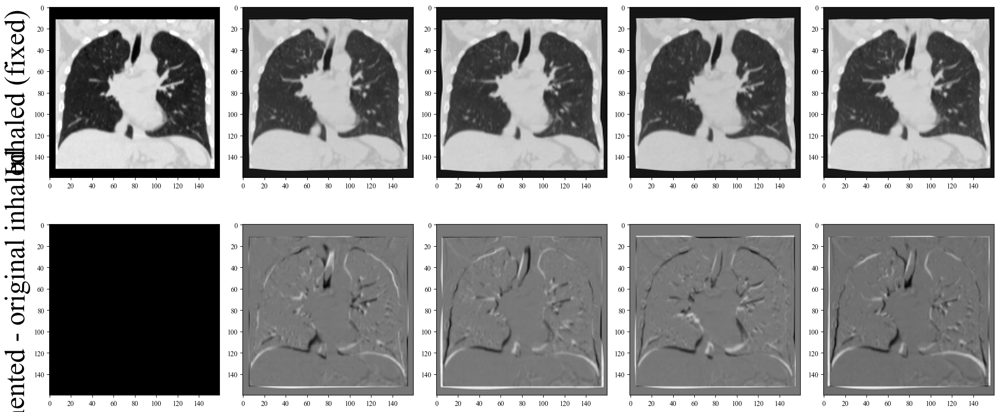

In [22]:
dataset_synthetic_SMOD = DatasetLung(train_val_test='train', version='', root_data=root_data, 
                                augmenter=augmenter_SMOD, augment="SMOD_breath", save_augmented=False)

i=2
cols=5
fig, axs = plt.subplots(nrows=2, ncols=cols, figsize=(20, 9))

moving, fixed = np.asarray(imgs_moving[i][0]), np.asarray(imgs_fixed[i][0])
axs[0,0].imshow(fixed[:,64,:], cmap='gray')
axs[1,0].imshow((fixed-fixed)[:,64,:], cmap='gray')

for j in range(cols-1):
    moving_SMOD, fixed_SMOD = dataset_synthetic_SMOD[i]
    moving_SMOD, fixed_SMOD = np.asarray(moving_SMOD[0].to("cpu")), np.asarray(fixed_SMOD[0].to("cpu"))
    axs[0,j+1].imshow(fixed_SMOD[:,64,:], cmap='gray')
    axs[1,j+1].imshow((fixed_SMOD-fixed)[:,64,:], cmap='gray')

# for ax in axs.flatten():
#     ax.set_axis_off()

rows = ["Inhaled (fixed)", "augmented - original inhaled"] 
for ax, row in zip(axs[:,0], rows):
    ax.set_ylabel(row, rotation=90, fontsize=40)



plt.tight_layout()
plt.show()

## 3 plot range of σ₂

In [7]:
# Generating varying sigma 2 images
s2_values = [500, 1000, 2000, 3000, 4000, 5000, 7500, 10000, 12500, 15000, 17500, 20000]
imgs_moving_s2 = []
imgs_fixed_s2 = []

for sigma in s2_values:
    augmenter = Augmentation_SMOD(root_data=root_data, original_dataset=dataset_original,
                                 sigma1=0, sigma2=sigma, plot=False, load_atlas=True,
                                 load_preprocessing=True, save_preprocessing=False)
    dataset_synthetic = DatasetLung(train_val_test='train', version='', root_data=root_data,
                                    augmenter=augmenter, augment="SMOD_breath", save_augmented=False)
    imgs_mov, imgs_fix = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_synthetic])
    imgs_moving_s2.append(imgs_mov)
    imgs_fixed_s2.append(imgs_fix)


Loading preprocessing data...
Done with augmentation initialization
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating art

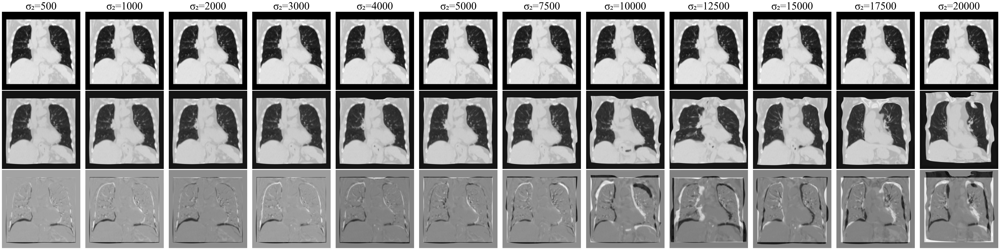

In [12]:
i = 4

fig, axs = plt.subplots(nrows=3, ncols=len(s2_values), figsize=((len(s2_values)+1)*4, 13))

for j, sigma in enumerate(s2_values):
    axs[0, j].imshow(np.asarray(imgs_moving_s2[j][i][0])[:, 64, :], cmap='gray')
    axs[1, j].imshow(np.asarray(imgs_fixed_s2[j][i][0])[:, 64, :], cmap='gray')
    axs[2, j].imshow((np.asarray(imgs_moving_s2[j][i][0]) - np.asarray(imgs_fixed_s2[j][i][0]))[:, 64, :], cmap='gray')
    axs[2, j].imshow((np.asarray(imgs_fixed[i][0]) - np.asarray(imgs_fixed_s2[j][i][0]))[:, 64, :], cmap='gray')
    axs[0, j].set_title(f'σ₂={sigma}', fontsize=40)


fig, axs = plt.subplots(nrows=3, ncols=(len(s1_values)+1), figsize=((len(s1_values)+1)*4, 13))

axs[0, 0].imshow(np.asarray(imgs_moving[i][0])[:, 64, :], cmap='gray')
axs[1, 0].imshow(np.asarray(imgs_fixed[i][0])[:, 64, :], cmap='gray')
axs[2, 0].imshow((np.asarray(imgs_moving[i][0]) - np.asarray(imgs_fixed[i][0]))[:, 64, :], cmap='gray')
axs[0, 0].set_title("Real", fontsize=40)

for j, sigma in enumerate(s1_values):
    axs[0, j+1].imshow(np.asarray(imgs_moving_s1[j][i][0])[:, 64, :], cmap='gray')
    axs[1, j+1].imshow(np.asarray(imgs_fixed_s1[j][i][0])[:, 64, :], cmap='gray')
    axs[2, j+1].imshow((np.asarray(imgs_moving_s1[j][i][0]) - np.asarray(imgs_fixed_s1[j][i][0]))[:, 64, :], cmap='gray')
    axs[0, j+1].set_title(f'σ₁={sigma}', fontsize=40)    

rows = ["Exhaled (moving)", "Inhaled (fixed)", "Exhaled - inhaled", "Inhaled real - inhaled SMOD"]

for ax, row in zip(axs[:, 0], rows):
    ax.set_ylabel(row, rotation=90, fontsize=35)

for ax in axs.flatten():
    ax.set_axis_off()


plt.tight_layout()
plt.show()

## 3 plot range of σ₁

In [9]:
# Generating varying sigma 2 images
s1_values = [500, 2500, 5000, 10000, 20000, 30000, 40000, 50000, 75000, 100000]
imgs_moving_s1 = []
imgs_fixed_s1 = []

for sigma in s1_values:
    augmenter = Augmentation_SMOD(root_data=root_data, original_dataset=dataset_original,
                                 sigma1=sigma, sigma2=4000, plot=False, load_atlas=True,
                                 load_preprocessing=True, save_preprocessing=False)
    dataset_synthetic = DatasetLung(train_val_test='train', version='', root_data=root_data,
                                    augmenter=augmenter, augment="SMOD", save_augmented=False)
    imgs_mov, imgs_fix = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_synthetic])
    imgs_moving_s1.append(imgs_mov)
    imgs_fixed_s1.append(imgs_fix)

Loading preprocessing data...
Done with augmentation initialization
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating art

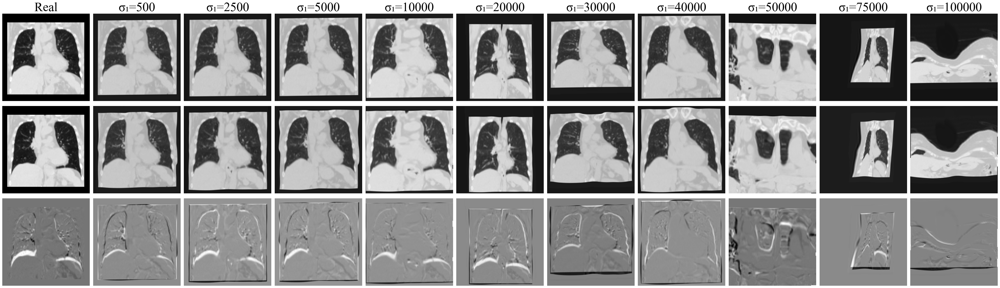

In [14]:
i = 4

fig, axs = plt.subplots(nrows=3, ncols=(len(s1_values)+1), figsize=((len(s1_values)+1)*4, 13))

axs[0, 0].imshow(np.asarray(imgs_moving[i][0])[:, 64, :], cmap='gray')
axs[1, 0].imshow(np.asarray(imgs_fixed[i][0])[:, 64, :], cmap='gray')
axs[2, 0].imshow((np.asarray(imgs_moving[i][0]) - np.asarray(imgs_fixed[i][0]))[:, 64, :], cmap='gray')
axs[0, 0].set_title("Real", fontsize=40)

for j, sigma in enumerate(s1_values):
    axs[0, j+1].imshow(np.asarray(imgs_moving_s1[j][i][0])[:, 64, :], cmap='gray')
    axs[1, j+1].imshow(np.asarray(imgs_fixed_s1[j][i][0])[:, 64, :], cmap='gray')
    axs[2, j+1].imshow((np.asarray(imgs_moving_s1[j][i][0]) - np.asarray(imgs_fixed_s1[j][i][0]))[:, 64, :], cmap='gray')
    axs[0, j+1].set_title(f'σ₁={sigma}', fontsize=40)

rows = ["Exhaled", "Inhaled", "Exhaled - inhaled"]

for ax, row in zip(axs[:, 0], rows):
    ax.set_ylabel(row, rotation=90, fontsize=40)

for ax in axs.flatten():
    ax.set_axis_off()

plt.tight_layout()
# plt.suptitle(f"Patient {i//2}", fontsize=45, y=1.03)
plt.show()

## overig

In [61]:
5//2

2

In [ ]:
# Prepare data
i=0

img_fixed, img_moving = imgs_fixed[i], imgs_moving[i]
#SMOD
DVF_exhaled_s2000 = augmenter_SMOD.generate_artificial_DVFs(DVFs_artificial_components=augmenter_SMOD.DVF_exhaled_components, 
                                                sigma=2000)
img_exhaled_s2000 = augmenter_SMOD.transform(img_moving=img_fixed[0], DVF_itk=DVF_exhaled_s2000)
#Gryds
DVF_augment, DVF_respiratory = augmenter_gryds.generate_on_the_fly(img_fixed)
DVF_augment, DVF_respiratory = DVF_augment[0].to('cpu'), DVF_respiratory[0].to('cpu')
img_moving_gryds, img_fixed_gryds = imgs_moving_gryds[i].to('cpu'), imgs_fixed_gryds[i].to('cpu')


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


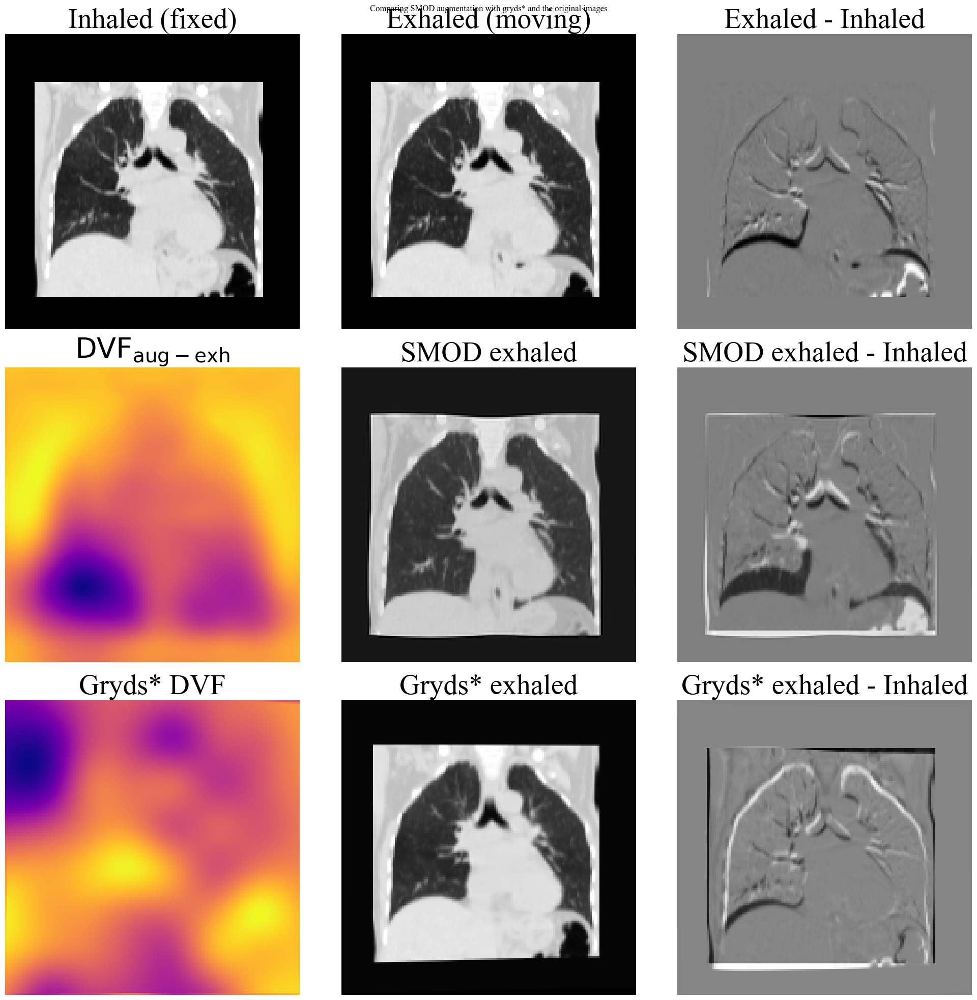

In [89]:

# Plot SMOD exhalation
fig, axs = plt.subplots(3, 3, figsize=(20,20))
im_moving, im_fixed = np.asarray(img_moving[0]), np.asarray(img_fixed[0])
axs[0,0].imshow(im_moving[:,64,:], cmap='gray')
axs[0,0].set_title('Inhaled (fixed)', fontsize=40)
axs[0,1].imshow(np.asarray(img_fixed[0])[:,64,:], cmap='gray')
axs[0,1].set_title('Exhaled (moving)', fontsize=40)
axs[0,2].imshow(np.asarray(np.asarray(img_fixed[0])-(im_moving))[:,64,:], cmap='gray')
axs[0,2].set_title('Exhaled - Inhaled', fontsize=40)

axs[1,0].imshow(DVF_exhaled_s2000[:,64,:,2], cmap="plasma")
axs[1,0].set_title(r'$\mathrm{DVF}_{\mathrm{aug-exh}}$', fontsize=40)
axs[1,1].imshow(np.asarray(img_exhaled_s2000)[:,64,:], cmap='gray')
axs[1,1].set_title('SMOD exhaled', fontsize=40)
axs[1,2].imshow(np.asarray(img_exhaled_s2000-im_moving)[:,64,:], cmap='gray')
axs[1,2].set_title('SMOD exhaled - Inhaled', fontsize=40)

axs[2,0].imshow(DVF_respiratory[1,:,64,:], cmap="plasma")
axs[2,0].set_title('Gryds* DVF', fontsize=40)
axs[2,1].imshow(np.asarray(img_moving_gryds[0])[:,64,:], cmap='gray')
axs[2,1].set_title('Gryds* exhaled', fontsize=40)
axs[2,2].imshow(np.asarray(img_fixed_gryds[0]-im_moving)[:,64,:], cmap='gray')
axs[2,2].set_title('Gryds* exhaled - Inhaled', fontsize=40)

for ax in axs.flatten():
    ax.set_axis_off()
plt.suptitle("Comparing SMOD augmentation with gryds* and the original images")
plt.tight_layout()
fig.show()

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


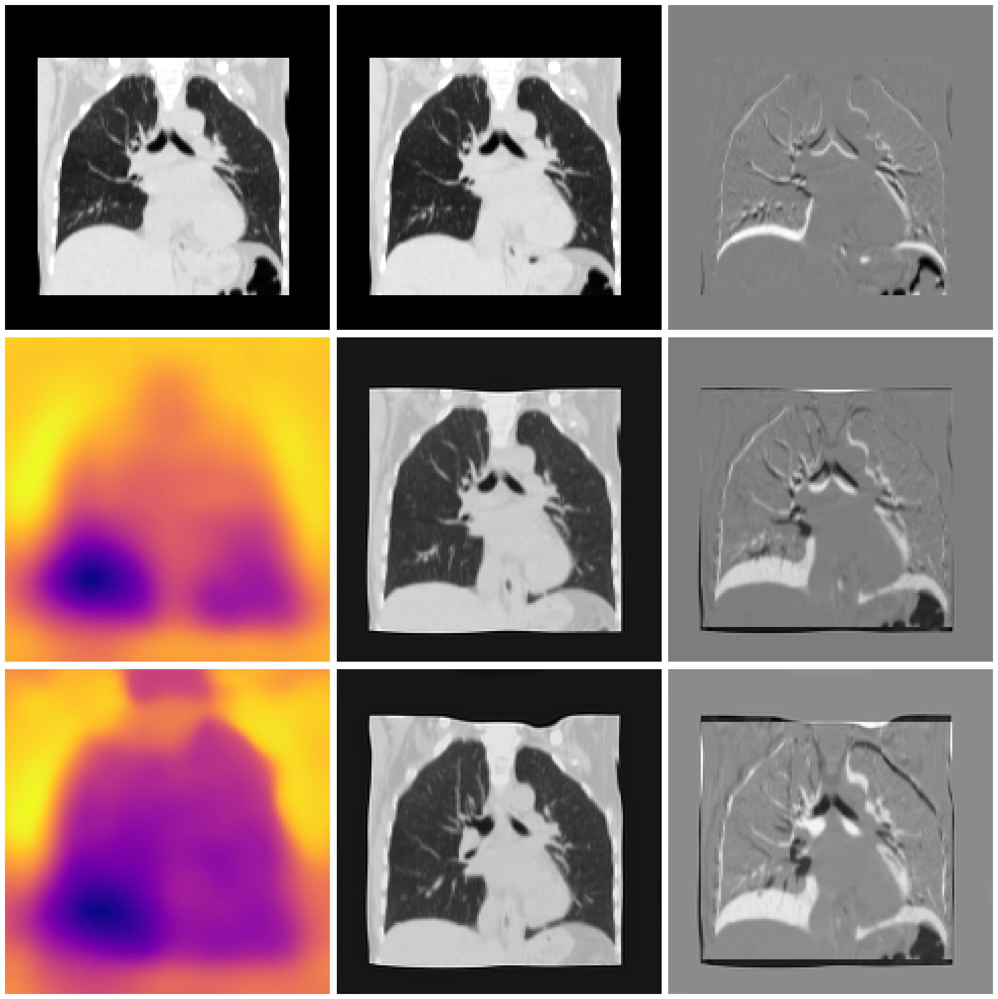

In [87]:

i=0


DVF_exhaled_s1000 = augmenter_SMOD.generate_artificial_DVFs(DVFs_artificial_components=augmenter_SMOD.DVF_exhaled_components, 
                                                sigma=500)
img_exhaled_s1000 = augmenter_SMOD.transform(img_moving=imgs_fixed[i][0], DVF_itk=DVF_exhaled_s1000)
DVF_exhaled_s4000 = augmenter_SMOD.generate_artificial_DVFs(DVFs_artificial_components=augmenter_SMOD.DVF_exhaled_components, 
                                                sigma=4000)
img_exhaled_s4000 = augmenter_SMOD.transform(img_moving=imgs_fixed[i][0], DVF_itk=DVF_exhaled_s4000)


fig, axs = plt.subplots(3, 3, figsize=(20,20))

axs[0,0].imshow(np.asarray(imgs_moving[i][0])[:,64,:], cmap='gray')
axs[0,1].imshow(np.asarray(imgs_fixed[i][0])[:,64,:], cmap='gray')
axs[0,2].imshow(np.asarray((np.asarray(imgs_moving[i][0])-np.asarray(imgs_fixed[i][0])))[:,64,:], cmap='gray')


axs[1,0].imshow(DVF_exhaled_s1000[:,64,:,2], cmap="plasma")
axs[1,1].imshow(np.asarray(img_exhaled_s1000)[:,64,:], cmap='gray')
axs[1,2].imshow(np.asarray(np.asarray(imgs_moving[i][0])-img_exhaled_s1000)[:,64,:], cmap='gray')

axs[2,0].imshow(DVF_exhaled_s4000[:,64,:,2], cmap="plasma")
axs[2,1].imshow(np.asarray(img_exhaled_s4000)[:,64,:], cmap='gray')
axs[2,2].imshow(np.asarray(np.asarray(imgs_moving[i][0])-img_exhaled_s4000)[:,64,:], cmap='gray')




for ax in axs.flatten():
    ax.set_axis_off()
plt.tight_layout()
fig.show()

In [79]:
#SMOD
augmenter_SMOD = Augmentation_SMOD(root_data=root_data, original_dataset=dataset_original,
                                    sigma1=0, sigma2=2000, plot=False, load_atlas=True, 
                                    load_preprocessing=True, save_preprocessing=False)
dataset_synthetic_SMOD_s2_4000 = DatasetLung(train_val_test='train', version='', root_data=root_data, 
                                augmenter=augmenter_SMOD, augment="SMOD_breath", save_augmented=False)
imgs_moving_SMOD, imgs_fixed_SMOD = zip(*[(img_moving, img_fixed) for img_moving, img_fixed in dataset_synthetic_SMOD_s2_4000])
#Gryds
# img_moving_gryds, img_fixed_gryds = imgs_moving_gryds[i].to('cpu'), imgs_fixed_gryds[i].to('cpu')

Loading preprocessing data...
Done with augmentation initialization
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating artificial DVF
Generating artificial image
Generating art

Visualizing sigma2 in SMODinsp

In [149]:
np.asarray(imgs_moving[i][0]).shape

(160, 128, 160)

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


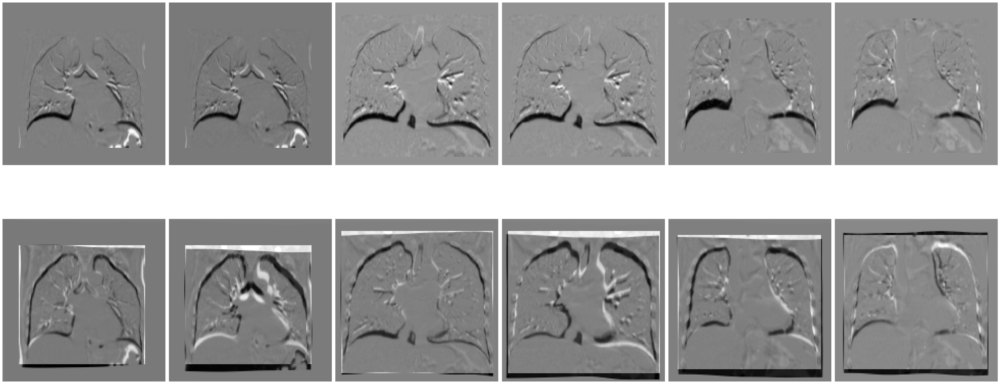

In [130]:
# Plot SMOD exhalation

fig, axs = plt.subplots(2, 6, figsize=(40,20))
for i in range(6):
    # img_to_plot = np.asarray(np.asarray(imgs_moving[i][0])-np.asarray(imgs_moving_SMOD[i][0]))
    img_to_plot = np.asarray(imgs_fixed[i][0]) - np.asarray(imgs_moving_SMOD[i][0].to("cpu"))
    axs[0,i].imshow(img_to_plot[:,64,:], cmap='gray')

for i in range (6):
    # img_to_plot = np.asarray(np.asarray(imgs_moving[i][0])-np.asarray(img_moving_gryds[i][0].to('cpu')))
    img_to_plot = np.asarray(imgs_fixed[i][0]) - np.asarray(imgs_fixed_gryds[i][0].to("cpu"))
    axs[1,i].imshow(img_to_plot[:,64,:], cmap='gray')
# axs[0,0].set_title('Inhaled (fixed)', fontsize=40)
# axs[0,1].imshow(np.asarray(img_fixed[0])[:,64,:], cmap='gray')
# axs[0,1].set_title('Exhaled (moving)', fontsize=40)
# axs[0,2].imshow(np.asarray((np.asarray(img_moving[0])-np.asarray(img_fixed[0])))[:,64,:], cmap='gray')
# axs[0,2].set_title('Exhaled - Inhaled', fontsize=40)

# axs[1,0].imshow(DVF_exhaled_s2000[:,64,:,2], cmap="plasma")
# axs[1,0].set_title(r'$\mathrm{DVF}_{\mathrm{aug-exh}}$', fontsize=40)
# axs[1,1].imshow(np.asarray(img_exhaled_s2000)[:,64,:], cmap='gray')
# axs[1,1].set_title('SMOD exhaled', fontsize=40)
# axs[1,2].imshow(np.asarray(np.asarray(imgs_moving[i][0])-img_exhaled_s2000)[:,64,:], cmap='gray')
# axs[1,2].set_title('SMOD exhaled - Inhaled', fontsize=40)

# axs[2,0].imshow(DVF_respiratory[1,:,64,:], cmap="plasma")
# axs[2,0].set_title('Gryds* DVF', fontsize=40)
# axs[2,1].imshow(np.asarray(img_moving_gryds[0])[:,64,:], cmap='gray')
# axs[2,1].set_title('Gryds* exhaled', fontsize=40)
# axs[2,2].imshow((np.asarray(imgs_moving[i][0])-np.asarray(img_moving_gryds[0]))[:,64,:], cmap='gray')
# axs[2,2].set_title('Gryds* exhaled - Inhaled', fontsize=40)

for ax in axs.flatten():
    ax.set_axis_off()
plt.tight_layout()
fig.show()

In [ ]:
fig, axs = plt.subplots(3, 5, figsize=(40,20))
for i in range(3):
    axs[i,0].imshow(np.asarray(imgs_moving[i][0])[:,64,:], cmap='gray')
    axs[i,0].set_title('Original Exhaled', fontsize=40)
    axs[i,1].imshow(np.asarray(imgs_moving_SMOD[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[i,1].set_title('SMOD Inhaled', fontsize=40)

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


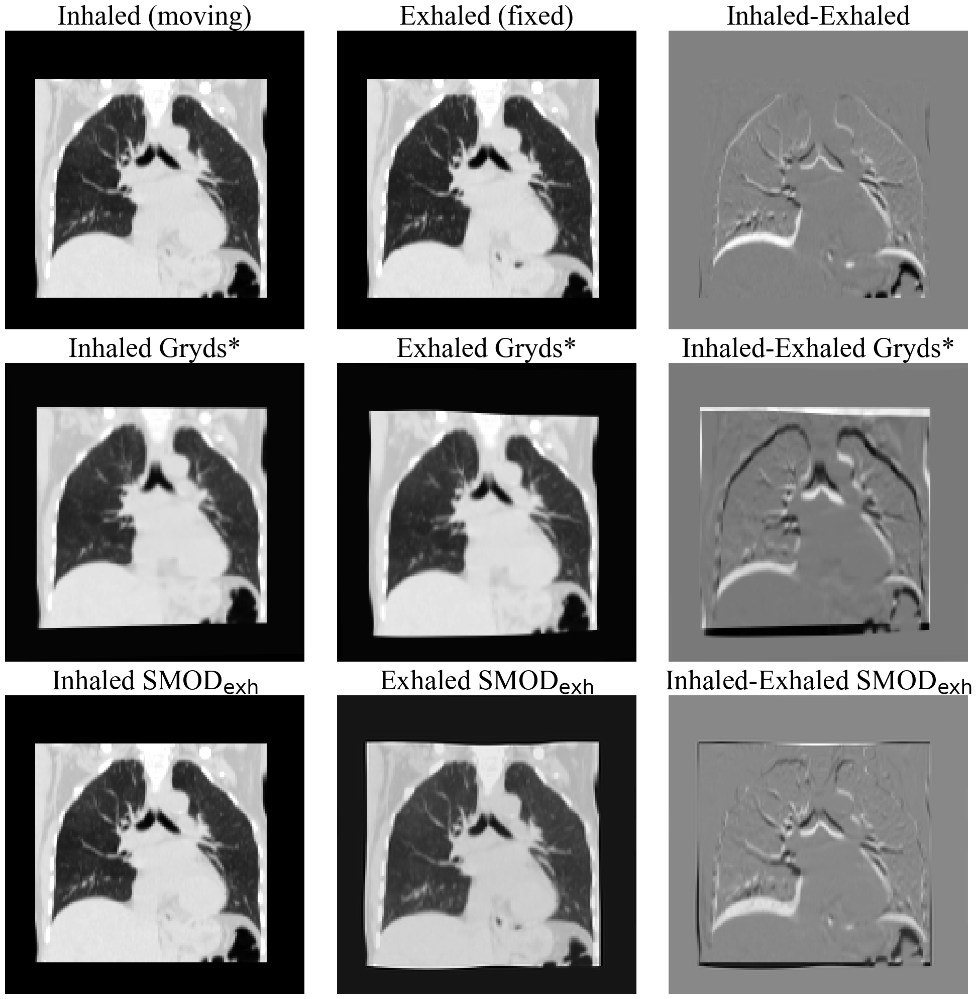

In [119]:
for i in range(1):
    fig, axs = plt.subplots(3, 3, figsize=(20,20))
    axs[0,0].imshow(np.asarray(imgs_moving[i][0])[:,64,:], cmap='gray')
    axs[0,0].set_title('Original inhaled (moving)', fontsize=40)
    axs[0, 1].imshow(np.asarray(imgs_fixed[i][0])[:,64,:], cmap='gray')
    axs[0, 1].set_title('Original exhaled (fixed)', fontsize=40)
    axs[0, 2].imshow((np.asarray(imgs_moving[i][0])-np.asarray(imgs_fixed[i][0]))[:,64,:], cmap='gray')
    axs[0, 2].set_title('Inhaled-Exhaled', fontsize=40)
    
    axs[1, 0].imshow(np.asarray(imgs_moving_gryds[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[1, 0].set_title('Inhaled Gryds*', fontsize=40)
    axs[1, 1].imshow(np.asarray(imgs_fixed_gryds[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[1, 1].set_title('Exhaled Gryds*', fontsize=40)
    axs[1, 2].imshow((np.asarray(imgs_moving_gryds[i][0].to("cpu")) - np.asarray(imgs_fixed_gryds[i][0].to("cpu")))[:,64,:], cmap='gray')
    axs[1, 2].set_title('Inhaled-Exhaled Gryds*', fontsize=40)
    
    axs[2, 0].imshow(np.asarray(imgs_moving_SMOD[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[2, 0].set_title('Inhaled SMOD'+r'$_{\mathrm{exh}}$', fontsize=40)
    axs[2, 1].imshow(np.asarray(imgs_fixed_SMOD[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[2, 1].set_title('Exhaled SMOD'+r'$_{\mathrm{exh}}$', fontsize=40)
    axs[2, 2].imshow((np.asarray(imgs_moving_SMOD[i][0].to("cpu") - np.asarray(imgs_fixed_SMOD[i][0].to("cpu"))))[:,64,:], cmap='gray')
    axs[2, 2].set_title('Inhaled-Exhaled SMOD'+r'$_{\mathrm{exh}}$', fontsize=40)
    for ax in axs.flatten():
        ax.set_axis_off()
    plt.tight_layout()
    fig.show()

In [ ]:
for i in range(1):
    fig, axs = plt.subplots(3, 3, figsize=(20,20))
    axs[0,0].imshow(np.asarray(imgs_moving[i][0])[:,64,:], cmap='gray')
    axs[0,0].set_title('Original inhaled (moving)', fontsize=40)
    axs[0, 1].imshow(np.asarray(imgs_fixed[i][0])[:,64,:], cmap='gray')
    axs[0, 1].set_title('Original exhaled (fixed)', fontsize=40)
    axs[0, 2].imshow((np.asarray(imgs_moving[i][0])-np.asarray(imgs_fixed[i][0]))[:,64,:], cmap='gray')
    axs[0, 2].set_title('Inhaled-Exhaled', fontsize=40)
    
    axs[1, 0].imshow(np.asarray(imgs_fixed_gryds[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[1, 0].set_title('Exhaled Gryds*', fontsize=40)
    axs[1, 1].imshow((np.asarray(imgs_moving_gryds[i][0].to("cpu")) - np.asarray(imgs_fixed_gryds[i][0].to("cpu")))[:,64,:], cmap='gray')
    axs[1, 1].set_title('Inhaled-Exhaled Gryds*', fontsize=40)
    axs[1, 1].imshow((np.asarray(imgs_moving_gryds[i][0].to("cpu")) - np.asarray(imgs_fixed_gryds[i][0].to("cpu")))[:,64,:], cmap='gray')
    axs[1, 1].set_title('Inhaled-Exhaled Gryds*', fontsize=40)
    
    axs[2, 0].imshow(np.asarray(imgs_moving_SMOD[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[2, 0].set_title('Inhaled SMOD'+r'$_{\mathrm{exh}}$', fontsize=40)
    axs[2, 1].imshow(np.asarray(imgs_fixed_SMOD[i][0].to("cpu"))[:,64,:], cmap='gray')
    axs[2, 1].set_title('Exhaled SMOD'+r'$_{\mathrm{exh}}$', fontsize=40)
    axs[2, 2].imshow((np.asarray(imgs_moving_SMOD[i][0].to("cpu") - np.asarray(imgs_fixed_SMOD[i][0].to("cpu"))))[:,64,:], cmap='gray')
    axs[2, 2].set_title('Inhaled-Exhaled SMOD'+r'$_{\mathrm{exh}}$', fontsize=40)
    for ax in axs.flatten():
        ax.set_axis_off()
    plt.tight_layout()
    fig.show()

In [56]:
DVF_respiratory.shape

torch.Size([3, 160, 128, 160])

In [78]:
imgs_moving_gryds.to('cpu')

AttributeError: 'tuple' object has no attribute 'to'